In [1]:
import os
import json
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from statsmodels.stats.multitest import multipletests
import statsmodels.formula.api as smf
from matplotlib.backends.backend_pdf import PdfPages
import warnings

import sys 
sys.path.append(r'..\utils') 
from utils import get_seaad_colors, get_tx_order


Functions

In [2]:
def compute_pairwise_group_interactions(data, depth_col, interaction_col, groups, features):
    """
    Compute pairwise group slope differences for each feature using
    depth x group interaction models.
    """

    all_results = []

    for feature in features:
        df_feat = data[[depth_col, interaction_col, feature]].dropna()
        if len(df_feat) < 5 or df_feat[feature].nunique() <= 1:
            continue

        pairwise_results = []

        # loop through each group (layer, subclass, supertype) as the reference
        for ref_group in groups:
            df_feat = df_feat.copy()
            df_feat[interaction_col] = pd.Categorical(df_feat[interaction_col], categories=groups)
            df_feat[interaction_col] = df_feat[interaction_col].cat.reorder_categories(
                [ref_group] + [l for l in groups if l != ref_group], ordered=True
            )

            model = smf.ols(f"{feature} ~ {depth_col} * {interaction_col}", data=df_feat).fit(cov_type='HC3')

            # extract interaction terms, ex: depth:layer[T.LayerX]
            for term in model.params.index:
                if f"{depth_col}:" in term:
                    comp_group = term.split('T.')[-1].replace(']', '')
                    pairwise_results.append({
                        'feature': feature,
                        'reference': ref_group,
                        'compare_to': comp_group,
                        'coef_diff': model.params[term],
                        'pval': model.pvalues[term],
                        'r_squared': model.rsquared,
                        'n': len(df_feat)
                    })

        # combine and apply FDR correction
        if pairwise_results:
            df_res = pd.DataFrame(pairwise_results)
            df_res['pval_fdr'] = multipletests(df_res['pval'], alpha=0.05, method='fdr_bh')[1]
            all_results.append(df_res)

    if not all_results:
        return None

    results_df = pd.concat(all_results, ignore_index=True)

    return results_df


In [3]:
def plot_feature_heatmaps(pairwise_df, fig_path, interaction_col, alpha=0.05):
    """
    For each feature, plot a heatmap of pairwise group slope differences.
    """
    features = pairwise_df['feature'].unique()
    groups = sorted(set(pairwise_df['reference']).union(pairwise_df['compare_to']))
    
    with PdfPages(fig_path) as pdf:
        with warnings.catch_warnings():
            warnings.simplefilter(action='ignore', category=FutureWarning)

        for feature in features:
            df_f = pairwise_df[pairwise_df['feature'] == feature]

            # create matrices for effect size and significance
            coef_matrix = pd.DataFrame(np.nan, index=groups, columns=groups)
            sig_mask = pd.DataFrame(False, index=groups, columns=groups)

            for _, row in df_f.iterrows():
                coef_matrix.loc[row['reference'], row['compare_to']] = row['coef_diff']
                sig_mask.loc[row['reference'], row['compare_to']] = row['pval_fdr'] > alpha

            # make it symmetric (optional)
            for i in groups:
                for j in groups:
                    if pd.isna(coef_matrix.loc[i, j]) and not pd.isna(coef_matrix.loc[j, i]):
                        coef_matrix.loc[i, j] = -coef_matrix.loc[j, i]
                        sig_mask.loc[i, j] = sig_mask.loc[j, i]

            #plot all, annotate signif:
            # annot_matrix = coef_matrix.round(2).astype(str)
            # annot_matrix[sig_mask == False] = annot_matrix[sig_mask == False] + '*'  # add star for significant
            # sns.heatmap(coef_matrix, annot=annot_matrix, fmt='', cmap='RdBu', center=0)

            #mask out non-signif:

            # Check if all off-diagonal cells are masked
            off_diag_mask = ~np.eye(len(sig_mask), dtype=bool)
            if sig_mask.values[off_diag_mask].all():
                # print(f"All off-diagonal values for feature '{feature}' are masked. Skipping plot.")
                continue

            fig = plt.figure(figsize=(6, 5))
            sns.heatmap(
                coef_matrix, 
                mask=sig_mask, 
                cmap='RdBu', 
                center=0, 
                annot=False, #True, 
                fmt=".2f", 
                cbar_kws={'label': 'Slope difference'},
                # annot_kws={"size": 8}  # set annotation font size
            )
            plt.title(f"{feature}\nPairwise {interaction_col.replace('_', '-')} slope differences (FDR < {alpha})")
            plt.xlabel("Comparison")
            plt.ylabel("Reference")

            pdf.savefig(fig, bbox_inches='tight')
            plt.close(fig)


In [4]:
def plot_significance_summary(pairwise_df, modality, interaction_col, alpha=0.05):
    """
    Create a summary heatmap showing the fraction of significant features
    for each group pair (after FDR correction).
    """
    groups = sorted(set(pairwise_df['reference']).union(pairwise_df['compare_to']))
    sig_matrix = pd.DataFrame(0.0, index=groups, columns=groups)
    n_features = pairwise_df['feature'].nunique()

    for (ref, comp), group in pairwise_df.groupby(['reference', 'compare_to']):
        frac_sig = len(group[group.pval_fdr < alpha]) / len(group)
        sig_matrix.loc[ref, comp] = frac_sig

    # make it symmetric
    for i in groups:
        for j in groups:
            if sig_matrix.loc[i, j] == 0 and sig_matrix.loc[j, i] != 0:
                sig_matrix.loc[i, j] = sig_matrix.loc[j, i]

    #mask upper triangle
    mask = np.triu(np.ones(sig_matrix.shape, dtype=bool), k=1)

    fig = plt.figure(figsize=(6, 5))
    sns.heatmap(
        sig_matrix, 
        cmap='rocket', 
        vmin=0, 
        # vmax=1, 
        annot=False, 
        fmt=".2f", 
        cbar_kws={'label': 'Fraction of significant features'},
        square=True, 
        mask=mask
    )
    plt.title(f"{modality.capitalize()} — {interaction_col.replace('_', '-')}\nFraction of significant slope differences\n(FDR < {alpha}, N={n_features} features)")
    plt.xlabel("Comparison")
    plt.ylabel("Reference")
    plt.show()

    return fig


Params

In [5]:

#HANN mapping
class_col = 'class_label_Hierarchical'
subclass_col = 'subclass_label_Hierarchical'
cluster_col = 'cluster_label_Hierarchical'

morpho_feature_type = 'dendrite' #dendrite, axon, both 


In [6]:
acute_only = True

In [7]:
#Load cell data
morpho_data_root = r'\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\Features\{}'.format(morpho_feature_type)
out_dir = r'\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\analysis\20251124_seaad\ME_depth_interaction\{}'.format(morpho_feature_type)
if acute_only:
    out_dir = os.path.join(out_dir, 'acute_only')
os.makedirs(out_dir, exist_ok=True)

ephys_data_path = r'\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\ephys\20251008\20251008_ephys_features.csv'

metadata = pd.read_csv(os.path.join(morpho_data_root, 'metadata.csv'))
metadata = metadata.rename(columns={'cell_id' : 'specimen_id'})
metadata = metadata.set_index('specimen_id')
metadata[subclass_col] = metadata[cluster_col].apply(lambda x: x.rsplit('_', 1)[0] if isinstance(x, str) else np.nan)

m_features_filled = pd.read_csv(os.path.join(morpho_data_root, 'RawFeatureWide.csv'), index_col='specimen_id')
m_features = m_features_filled.columns.tolist()

e_features_raw = pd.read_csv(ephys_data_path, index_col='specimen_id')
e_features_raw[subclass_col] = e_features_raw[subclass_col].replace('L5 ET_ME', 'L5 ET').replace('L5 ET(ME)', 'L5 ET')
e_meta_cols = ['specimen_id', 'specimen_name', 'subclass_label_Hierarchical', 'depth_from_pia_norm', 'ephys', 'feature_count']
e_nwg_cols = [c for c in e_features_raw.columns if c.startswith('nwg_')] #nathan features for FI curve plot (don't impute, don't use in eta2)
e_features = [c for c in e_features_raw.columns if not c in (e_meta_cols+e_nwg_cols)] #ephys features to impute (impute, use in eta2)

features = m_features_filled.merge(e_features_raw[e_features], how='inner', left_index=True, right_index=True)
features = features.merge(metadata, how='inner', left_index=True, right_index=True)
features['apical_basal_total_length'] = features['apical_dendrite_total_length'] + features['basal_dendrite_total_length']

#for the feature x depth plots, we can use the full M and E datasets independently, don't need the inner join 
full_metadata = pd.read_csv(r'\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\metadata\20251008\Datalock_Human_Glut_4_4_25(patchseq_mapping_results).csv', encoding='latin1')
full_metadata = full_metadata[~full_metadata['cell_id'].isna()]
full_metadata.set_index('cell_id', inplace=True)
full_metadata[cluster_col] = full_metadata[cluster_col].replace('L5 ET_ME', 'L5 ET(ME)')
m_data = m_features_filled.merge(full_metadata[[subclass_col, cluster_col, 'depth_from_pia_norm', 'paradigm']], left_index=True, right_index=True)
e_data = e_features_raw.merge(full_metadata[[cluster_col, 'paradigm']], left_index=True, right_index=True)

m_data = m_data[~m_data.depth_from_pia_norm.isna()]
e_data = e_data[~e_data.depth_from_pia_norm.isna()]

with open(r"\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\formatting_dicts\ttype_layer_dict.json", "r") as f:
    ttype_to_layer_dict = json.load(f)

with open(r"\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\formatting_dicts\L23_ttype_rename.json", "r") as f:
    L23_ttype_rename_dict = json.load(f)

m_data[cluster_col] = m_data[cluster_col].apply(lambda x: L23_ttype_rename_dict.get(x, x))
e_data[cluster_col] = e_data[cluster_col].apply(lambda x: L23_ttype_rename_dict.get(x, x))
m_data['layer'] = m_data[cluster_col].map(lambda x: ttype_to_layer_dict[x])
e_data['layer'] = e_data[cluster_col].map(lambda x: ttype_to_layer_dict[x])


# #morpho feature rename dict 
# morpho_feature_rename_df = pd.read_csv(r'\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\formatting_dicts\morpho_feature_rename.csv')
# morpho_feature_rename_dict = dict(zip(morpho_feature_rename_df.old_feature_name, morpho_feature_rename_df.alt_new_feature_name))

# #ephys feature rename dict 
# ephys_feature_rename_df = pd.read_csv(r'\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\formatting_dicts\ephys_feature_rename.csv')
# ephys_feature_rename_dict = dict(zip(ephys_feature_rename_df.old_feature_name, ephys_feature_rename_df.new_feature_name))

# m_data = m_data.rename(columns=morpho_feature_rename_dict)
# e_data = e_data.rename(columns=ephys_feature_rename_dict)




In [8]:
if acute_only:
    e_data = e_data[e_data.paradigm == 'acute']

In [9]:
color_dict = get_seaad_colors()

with open(r'\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\data\colors\layer_colors.json') as f:
    layer_color_dict = json.load(f)

#Get custom transcriptomic order
ttype_order, subclass_order = get_tx_order()
group_order = {
    'subclass_label' : subclass_order,
    # 't_type' :  ttype_order, 
    'layer' : sorted(e_data.layer.unique())
}

compartment_column = {
    'apical' : 'apical_dendrite_total_length',
    'basal' : 'basal_dendrite_total_length',
    'neurite' : 'apical_basal_total_length'
}

tx_labels = {
    'subclass_label' : 'subclass',
    't_type' : 'ttype',
    'layer' : 'layer'
}

tx_column = {
    'subclass_label' : subclass_col,
    't_type' : cluster_col,
    'layer' : 'layer'
}

### Compute stats - difference in slope of OLS fit per various groupings --> layer, subclass, supertype

In [10]:
depth_column = 'depth_from_pia_norm'

interaction_modality_dfs = {}
for modality in ['ephys', 'morpho']:
    interaction_modality_dfs[modality] = {}
    
    if modality == 'morpho':
        feature_cols = m_features
        data = m_data
    elif modality == 'ephys':
        feature_cols = e_features
        data = e_data
    else:   
        raise ValueError(f'Unknown modality: {modality}')
    
    for interaction_column in group_order.keys():
        print(f'{modality} - {interaction_column}')
    
        pairwise_interactions = compute_pairwise_group_interactions(
            data=data, 
            depth_col=depth_column, 
            interaction_col=tx_column[interaction_column], 
            groups=group_order[interaction_column],
            features=feature_cols
        )
        pairwise_interactions.to_csv(os.path.join(out_dir, f"depth_x_{modality}_feature_pairwise_{interaction_column}_interaction.csv"), index=False)
        interaction_modality_dfs[modality][interaction_column] = pairwise_interactions

ephys - subclass_label
ephys - layer
morpho - subclass_label
morpho - layer


Plot heatmap per feature

In [11]:
for modality in ['ephys', 'morpho']:
    for interaction_column in group_order.keys():
        print(f'{modality} - {interaction_column}')

        fig_path = os.path.join(out_dir, f"{modality}_{interaction_column}_significance_by_feature.pdf")
        plot_feature_heatmaps(interaction_modality_dfs[modality][interaction_column], fig_path, interaction_column)


ephys - subclass_label
ephys - layer
morpho - subclass_label
morpho - layer


Plot the fraction of significantly different depth ~ feature relationships per layer pair

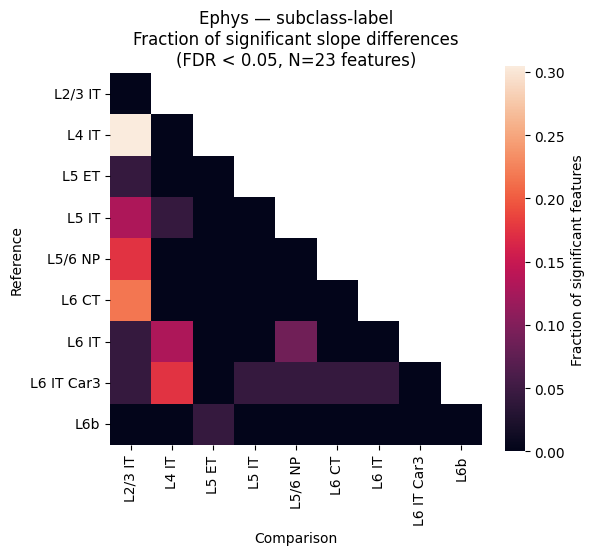

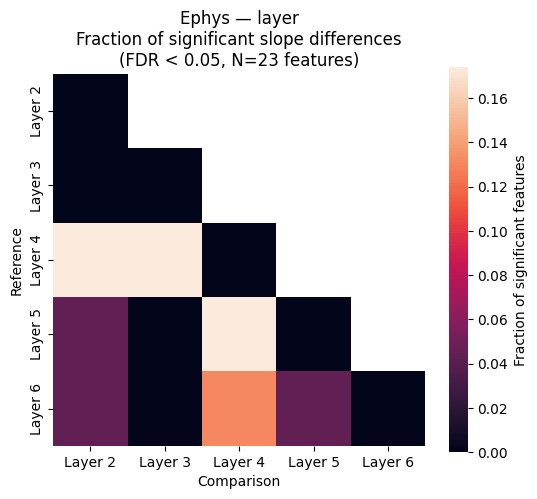

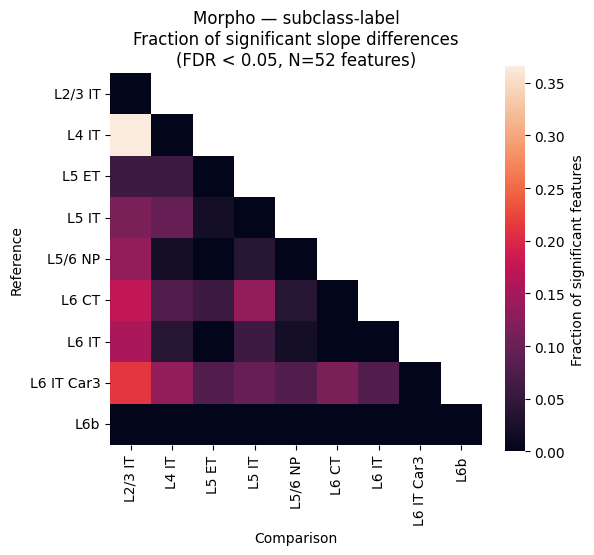

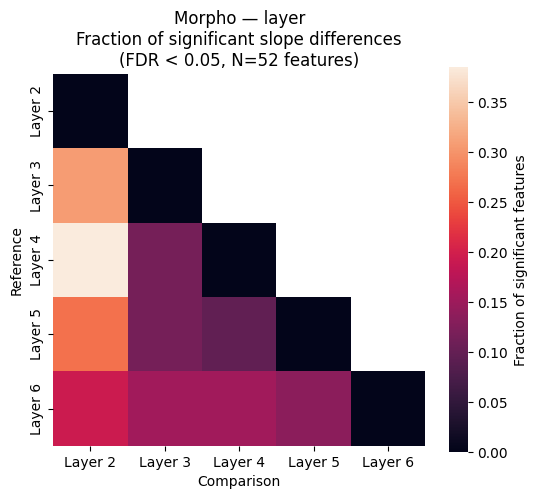

In [12]:
for modality in ['ephys', 'morpho']: 

    fig_path = os.path.join(out_dir, f"{modality}_interaction_significance_summary.pdf")
    with PdfPages(fig_path) as pdf:
        with warnings.catch_warnings():
            warnings.simplefilter(action='ignore', category=FutureWarning)

        for interaction_column in group_order.keys():
            fig = plot_significance_summary(interaction_modality_dfs[modality][interaction_column], modality, interaction_column)
            pdf.savefig(fig, bbox_inches='tight')

Plot scatters - L2, L3

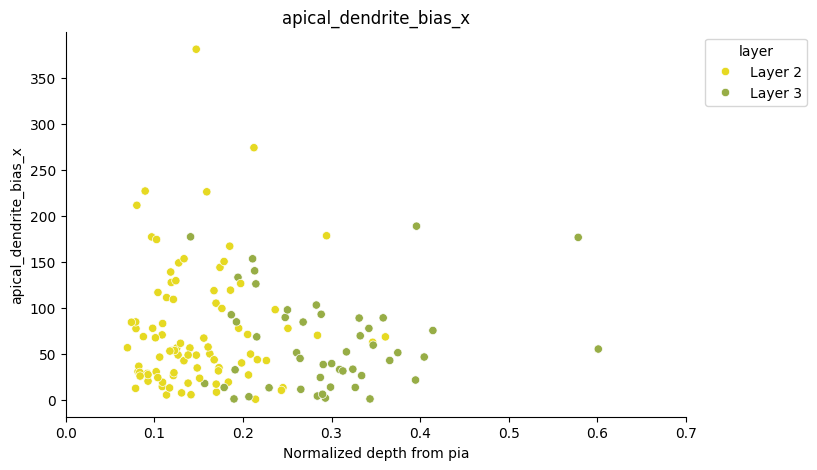

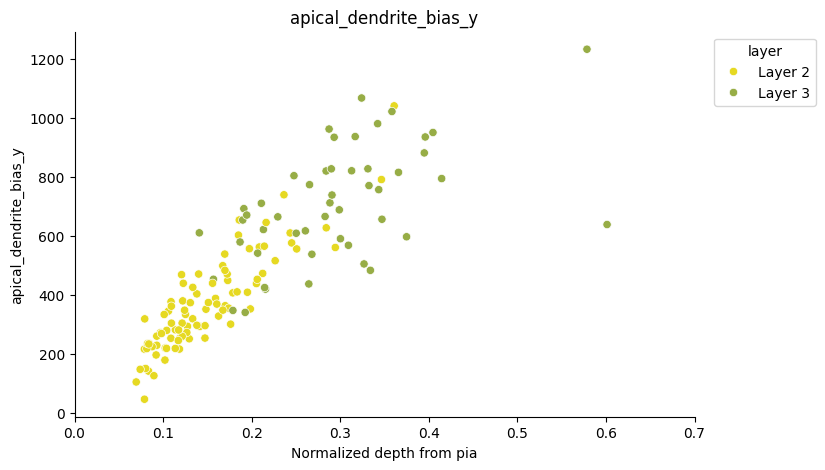

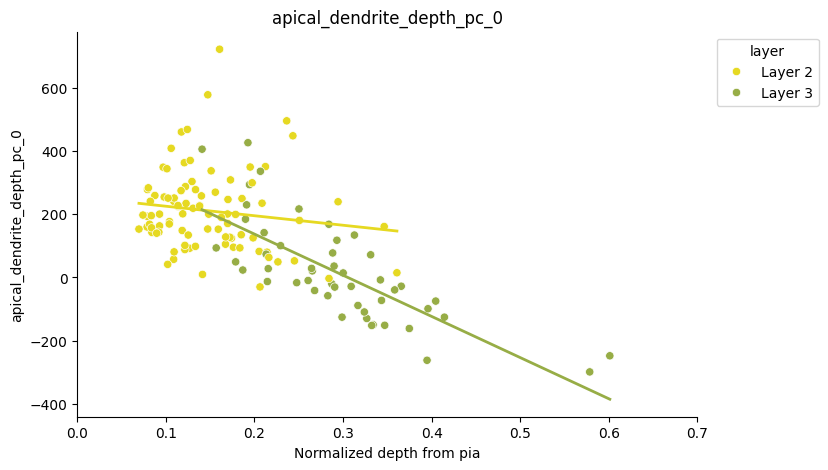

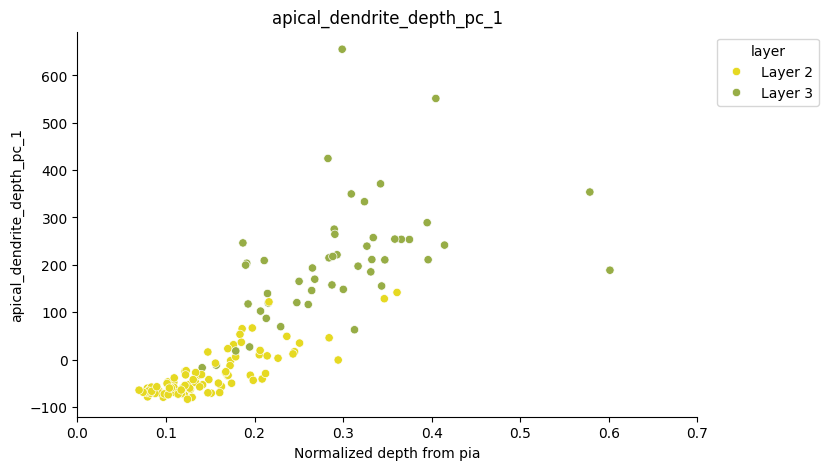

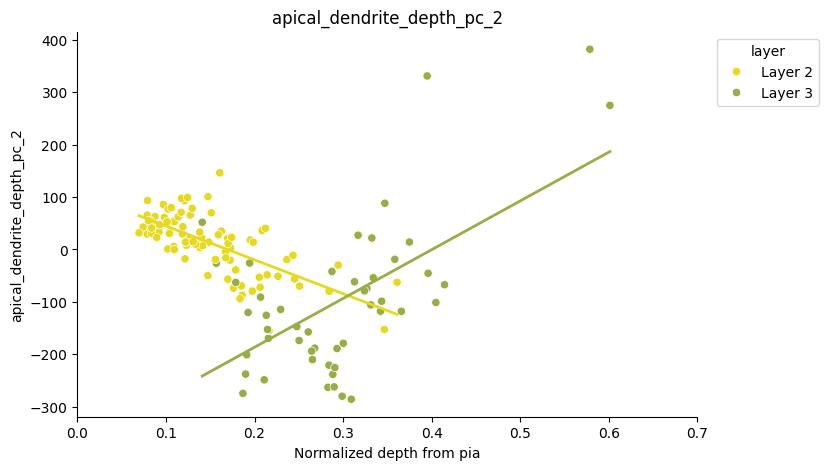

...

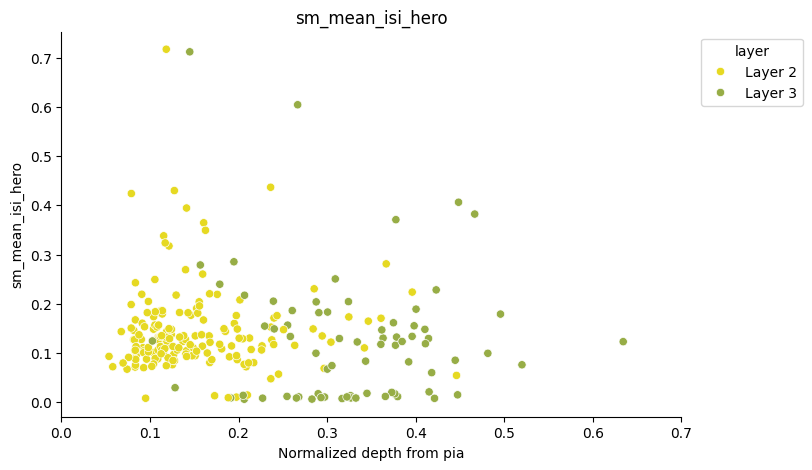

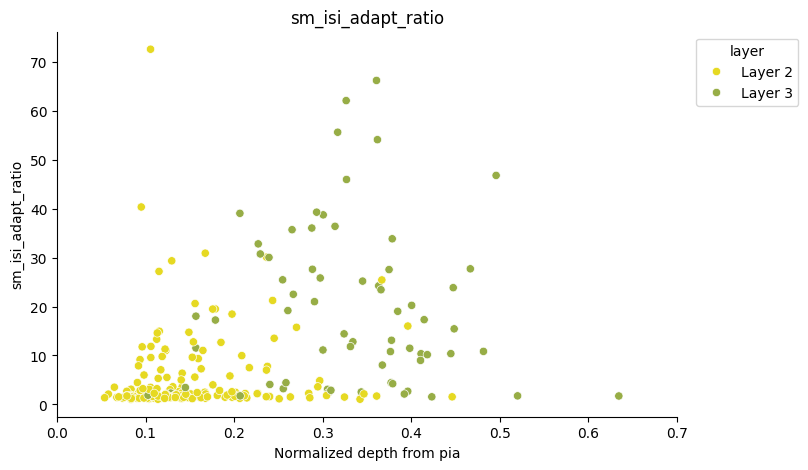

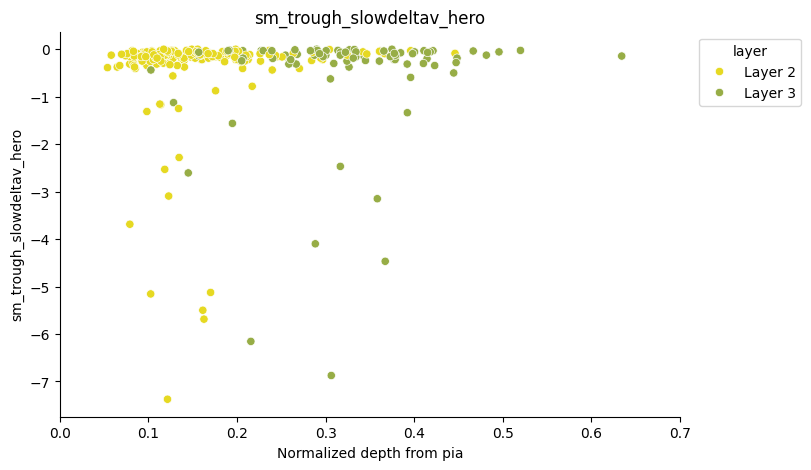

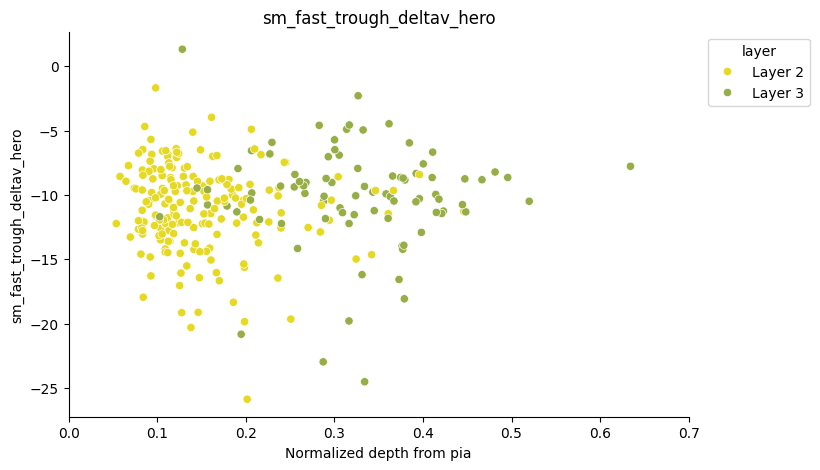

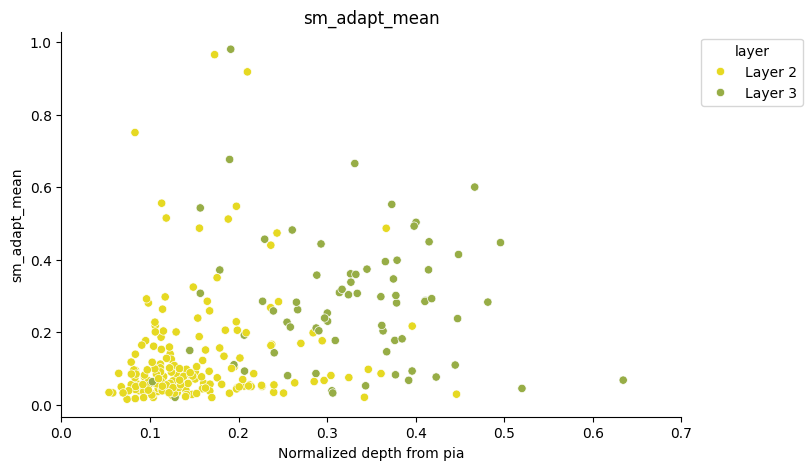

In [13]:
# Layer level plots

depth_column = 'depth_from_pia_norm'

layer_order = ['Layer 2', 'Layer 3'] #group_order['layer']
layer_col = 'layer'

layer_color_dict = {
    'Layer 2': "#E6D922",  # golden ochre
    'Layer 3': "#97AD46",  # botanical green
    'Layer 4': "#3DC2BB",  # turquoise
    'Layer 5': "#6195CF",  # periwinkle blue
    'Layer 6': "#A65FA1"   # orchid purple
}

for modality in ['morpho', 'ephys']:
    
    if modality == 'morpho':
        feature_cols = m_features
        data = m_data
    elif modality == 'ephys':
        feature_cols = e_features
        data = e_data
    else:
        raise ValueError(f'Unknown modality: {modality}')
    
    stats_df = interaction_modality_dfs[modality][layer_col]

    #just layer 2 and Layer 3 data
    data = data[data.layer.isin(['Layer 2', 'Layer 3'])]
    stats_df = stats_df[(stats_df.reference == 'Layer 2') & (stats_df.compare_to == 'Layer 3')] # * (stats_df.pval_fdr < 0.05)]

    fig_path = os.path.join(out_dir, f'{modality}_layer2_layer3_scatter_with_significantly_different_slopes.pdf')
    with PdfPages(fig_path) as pdf:
        with warnings.catch_warnings():
            warnings.simplefilter(action='ignore', category=FutureWarning)

        for feat in feature_cols:

            fig, ax = plt.subplots(figsize=(8, 5))
            sns.scatterplot( data=data, x=depth_column, y=feat, hue=layer_col, hue_order=layer_order, palette=layer_color_dict, ax=ax)
            sns.move_legend(ax, "upper left", bbox_to_anchor=(1.02, 1))

            if stats_df[stats_df['feature'] == feat]['pval_fdr'].iloc[0] < 0.05:

                # Plot regression lines per group
                for l in layer_order:
                    df_l = data[data['layer'] == l]
                    if len(df_l) > 2:
                        sns.regplot(
                            data=df_l, x=depth_column, y=feat,
                            scatter=False, label=f"{l}",
                            ci=None, 
                            line_kws={'lw': 2, 'color': layer_color_dict[l]})

            ax.set_title(f'{feat}')
            ax.set_xlabel('Normalized depth from pia')
            ax.set_ylabel(feat)
            ax.set_xlim((0, 0.7))
            sns.despine()
            pdf.savefig(fig, bbox_inches='tight')
            plt.show()


# Multiclass regression with interaction

Fns

In [14]:
from statsmodels.formula.api import ols
import statsmodels.api as sm
def AOV_Two_mixed(flist,a,b,df):

    #saves results as feature dictionary 
    # ANOVA_results = {}
    # for f in flist:
    #     model = ols(f'{f} ~C({a}) + ({b}) + C({a}):({b})', data = df).fit()
    #     ANOVA_results[f] = sm.stats.anova_lm(model,typ = 2)

    #saves results as one df
    all_results = []  
    for f in flist:
        model = ols(f'{f} ~ C({a}) + ({b}) + C({a}):({b})', data=df).fit()
        anova_table = sm.stats.anova_lm(model, typ=2)
        anova_table["feature"] = f  
        all_results.append(anova_table)

    # combine all into one DataFrame
    ANOVA_results = pd.concat(all_results, keys=flist).reset_index(level=1).reset_index(drop=True)
    ANOVA_results = ANOVA_results.rename(columns={'level_1' : 'level'})
    ANOVA_results = ANOVA_results[['feature', 'level', 'sum_sq', 'df', 'F', 'PR(>F)']]

    # Apply FDR correction on the p-values
    # 'PR(>F)' column contains the p-values
    pvals = ANOVA_results['PR(>F)'].values

    # Only keep non-NaN p-values for correction
    valid = ~np.isnan(pvals)
    pvals_valid = pvals[valid]

    # Perform FDR correction on valid p-values
    reject, pvals_fdr, _, _ = multipletests(pvals_valid, alpha=0.05, method='fdr_bh')

    # Create a full array of NaNs and fill corrected values
    pvals_fdr_full = np.full_like(pvals, np.nan, dtype=float)
    pvals_fdr_full[valid] = pvals_fdr

    # Add to DataFrame
    ANOVA_results['PR(>F)_FDR'] = pvals_fdr_full

    return ANOVA_results


Compute stats

In [15]:
continuous_col = 'depth_from_pia_norm'
categorical_col = 'layer'

multimodal_interaction_dfs = {}
for modality in ['ephys', 'morpho']:
    if modality == 'morpho':
        feature_cols = m_features
        data = m_data
    elif modality == 'ephys':
        feature_cols = e_features
        data = e_data
    else:   
        raise ValueError(f'Unknown modality: {modality}')
    
    data = data[data[categorical_col].isin(['Layer 2', 'Layer 3'])]
    modality_multimodal_interaction_df = AOV_Two_mixed(feature_cols, categorical_col, continuous_col, data)
    multimodal_interaction_dfs[modality] = modality_multimodal_interaction_df

    modality_multimodal_interaction_df.to_csv(os.path.join(out_dir, f'{modality}_multimodal_regression_with_interaction.csv'), index=False)


C:\Users\sarah.wallingbell\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  warnings.warn('covariance of constraints does not have full '
C:\Users\sarah.wallingbell\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:1923: RuntimeWarning: invalid value encountered in divide
  F /= J
C:\Users\sarah.wallingbell\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  warnings.warn('covariance of constraints does not have full '
C:\Users\sarah.wallingbell\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  warnings.warn('covariance of constraints does not have f

In [16]:
modality_multimodal_interaction_df[(modality_multimodal_interaction_df.feature == 'apical_dendrite_bias_y') &
                                   (modality_multimodal_interaction_df.level == 'C(layer):depth_from_pia_norm')]['PR(>F)_FDR'].values[0] < 0.05

True

Plot scatters

Plot scatters - L2, L3 - plot all regression lines (solid if signif, dashed if not) and pval for the difference in slope

In [17]:
#Load the individual correlation data 
within_layer_stats = {}
within_layer_stats_dir = r'\\allen\programs\celltypes\workgroups\mousecelltypes\SarahWB\datasets\human_exc\analysis\20251010_seaad\ME_scatter\dendrite'
for modality in ['ephys', 'morpho']:
    within_layer_stats[modality] = pd.read_csv(os.path.join(within_layer_stats_dir, f'depth_x_{modality}_feature_stats_layer.csv'))

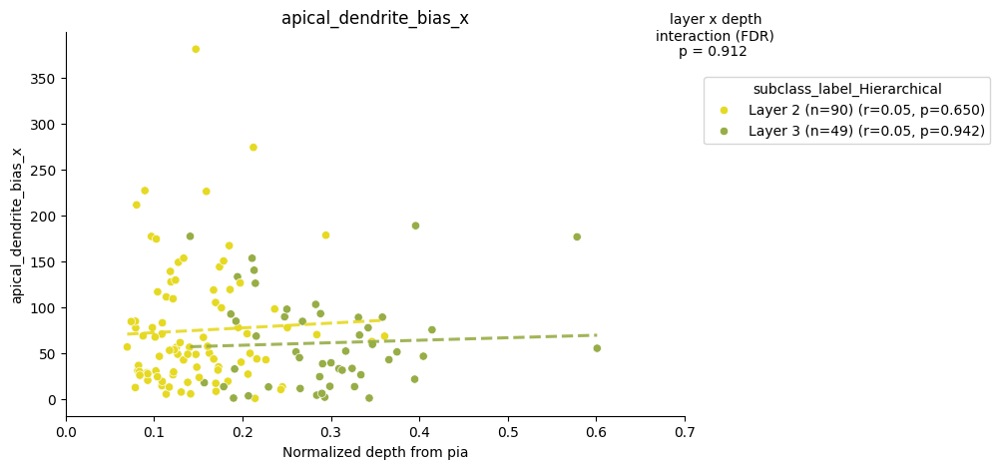

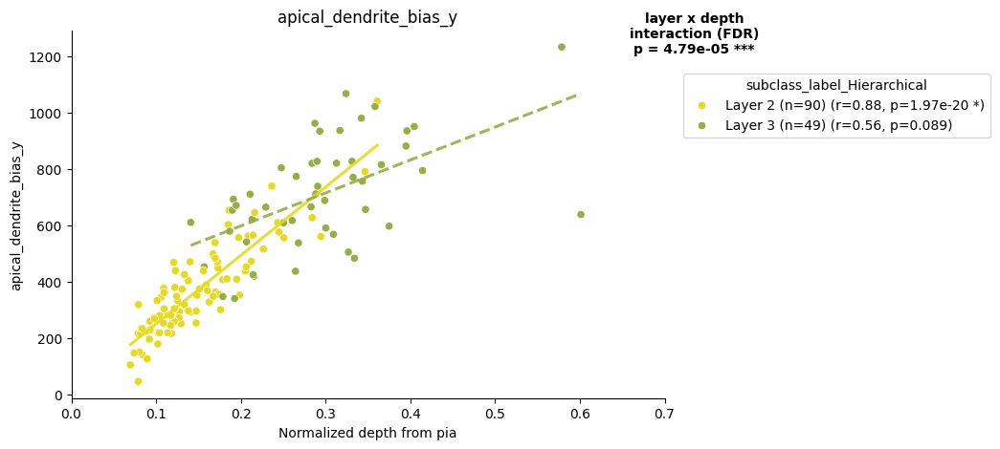

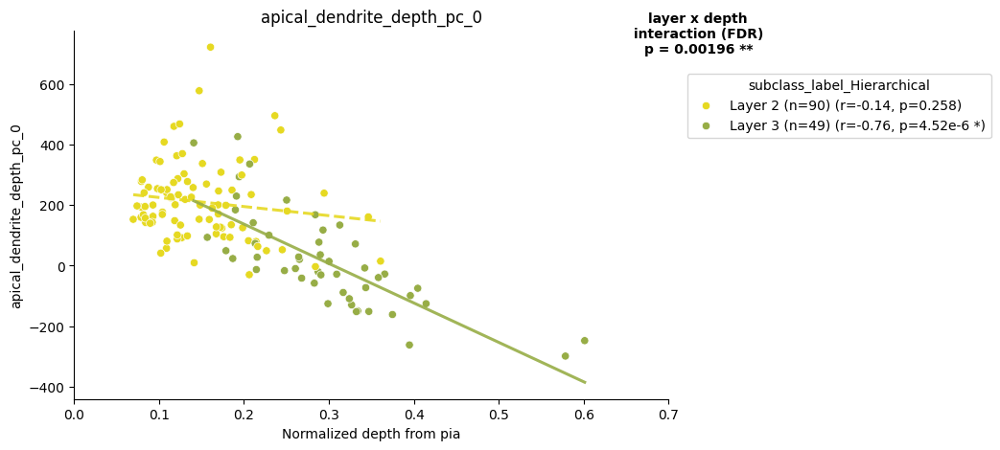

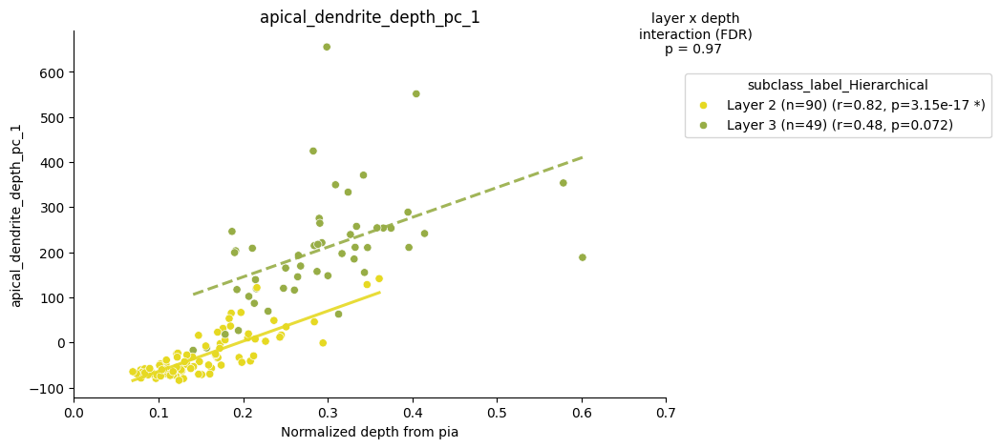

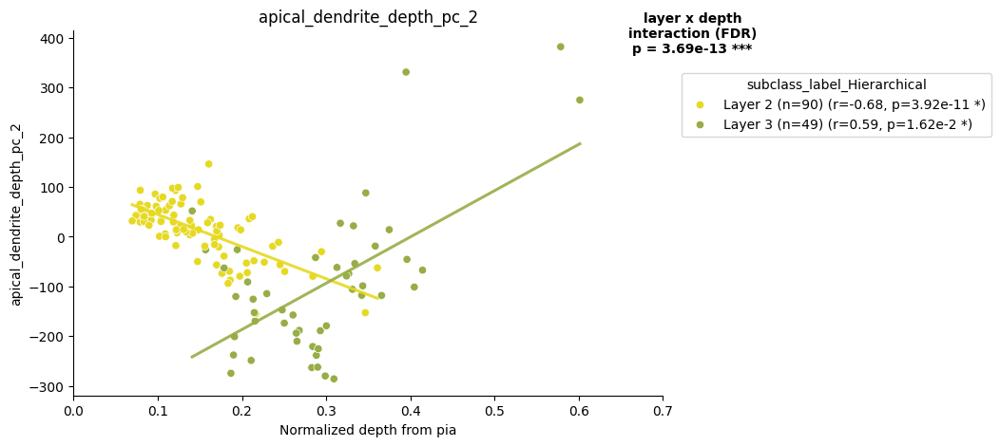

...

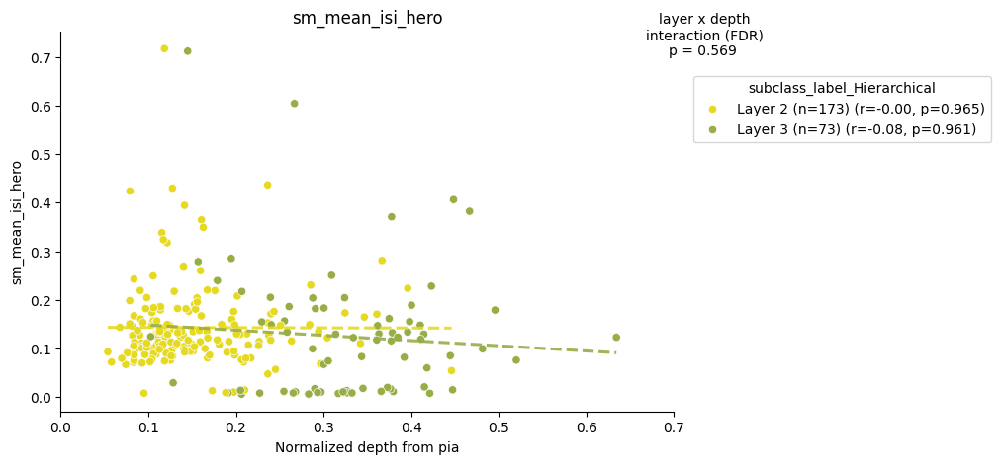

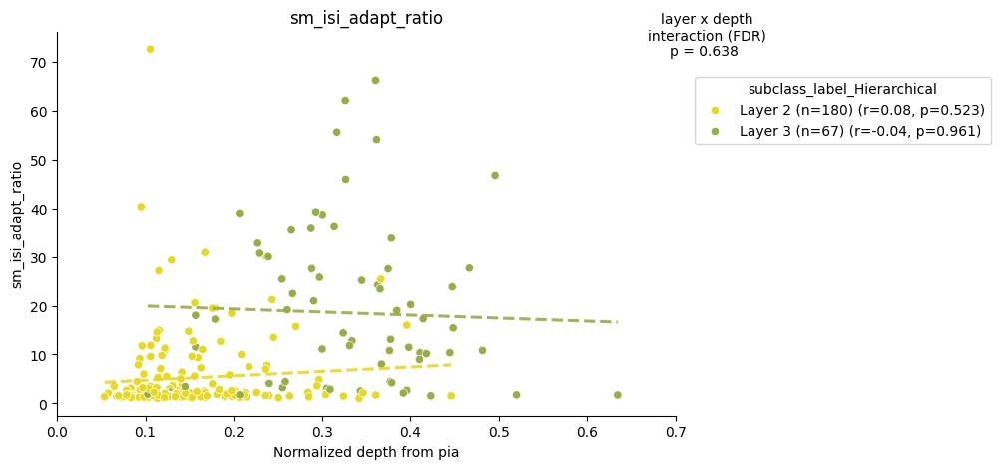

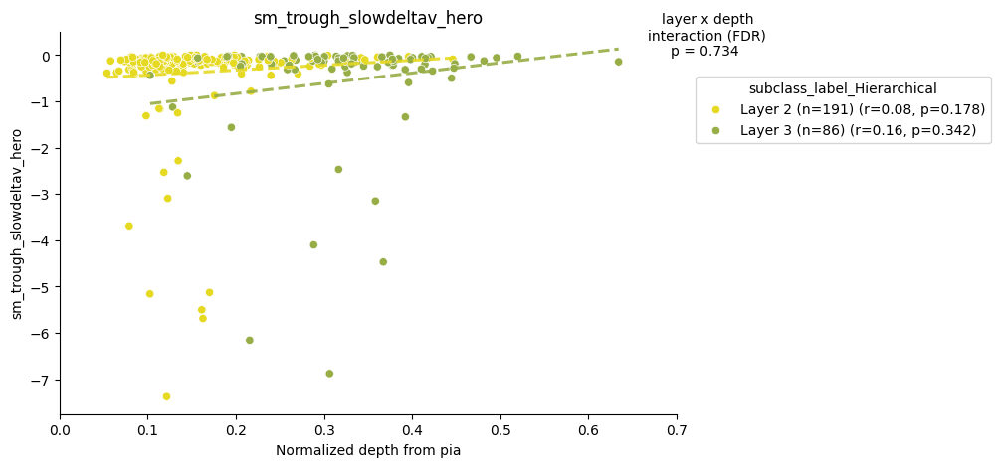

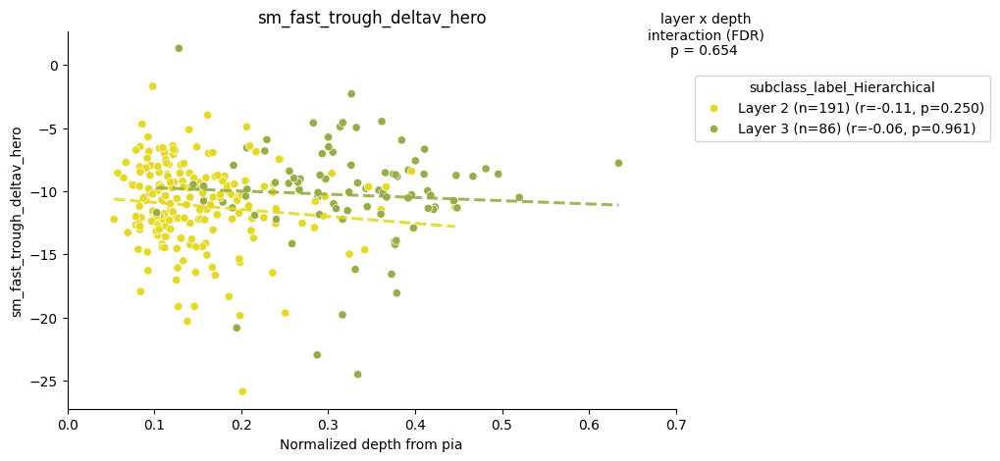

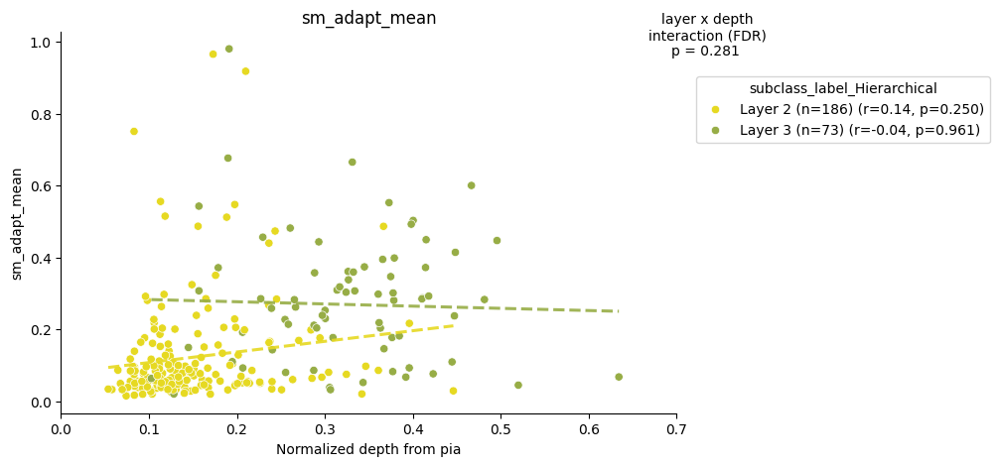

In [18]:
# Layer level plots

depth_column = 'depth_from_pia_norm'

layer_order = ['Layer 2', 'Layer 3'] #group_order['layer']
layer_col = 'layer'

layer_color_dict = {
    'Layer 2': "#E6D922",  # golden ochre
    'Layer 3': "#97AD46",  # botanical green
    'Layer 4': "#3DC2BB",  # turquoise
    'Layer 5': "#6195CF",  # periwinkle blue
    'Layer 6': "#A65FA1"   # orchid purple
}

for modality in ['morpho', 'ephys']:
    
    if modality == 'morpho':
        feature_cols = m_features
        data = m_data
    elif modality == 'ephys':
        feature_cols = e_features
        data = e_data
    else:
        raise ValueError(f'Unknown modality: {modality}')
    
    within_layer_stats_df = within_layer_stats[modality] #stats looking at if each layer regression line slope (correlation) is signif
    interaction_stats_df = multimodal_interaction_dfs[modality] #stats looking at if the depth~feature relationship is signif different between layers

    #just layer 2 and Layer 3 data
    data = data[data.layer.isin(['Layer 2', 'Layer 3'])]
    # interaction_stats_df = interaction_stats_df[(interaction_stats_df.reference == 'Layer 2') & (interaction_stats_df.compare_to == 'Layer 3')] # * (interaction_stats_df.pval_fdr < 0.05)]

    fig_path = os.path.join(out_dir, f'{modality}_layer2_layer3_scatter_all_regression_lines_with_significance_indicated.pdf')
    with PdfPages(fig_path) as pdf:
        with warnings.catch_warnings():
            warnings.simplefilter(action='ignore', category=FutureWarning)

        for feat in feature_cols:

            fig, ax = plt.subplots(figsize=(8, 5))
            sns.scatterplot( data=data, x=depth_column, y=feat, hue=layer_col, hue_order=layer_order, palette=layer_color_dict, ax=ax)

            legend_labels = {}
            for l in layer_order:                     
                legend_labels[l] = f"{l} (n={len(data[data['layer'] == l][[depth_column, feat]].dropna())})"

            #plot regression line (dashed if not signif)
            for _, row in within_layer_stats_df[(within_layer_stats_df.feature == feat) * (within_layer_stats_df.layer.isin(layer_order))].iterrows():
                layer = row['layer']
                intercept, slope = row['intercept'], row['slope']
                r = row['r']
                pval_fdr = row['pval_fdr']
                p_val_exp = int(np.floor(np.log10(pval_fdr)))  # Exponent of the p-value - for legend
                p_val_mant = pval_fdr / 10**p_val_exp  # Mantissa of the p-value - for legend

                # Get the original data points for this supertype
                data_points = data[(data['layer'] == layer)][[depth_column, feat]].dropna()
                n_cells = len(data_points)
                if n_cells < 3:
                    continue

                # Predict the regression line
                x_vals = np.linspace(data_points[depth_column].min(),
                                    data_points[depth_column].max(), 100)
                y_vals = intercept + slope * x_vals

                # plot
                color = layer_color_dict.get(layer, 'black')
                linestyle = '--' if pval_fdr >= 0.05 else '-'
                ax.plot(x_vals, y_vals, color=color, lw=2.2, alpha=0.9, linestyle=linestyle)
            
                if pval_fdr < 0.05: 
                    legend_labels[layer] = legend_labels[layer] + f" (r={r:.2f}, p={p_val_mant:.2f}e{p_val_exp} *)"
                else:
                    legend_labels[layer] = legend_labels[layer] + f" (r={r:.2f}, p={pval_fdr:.3f})"

            # Add annotation for interaction p-value
            comparison_pval = interaction_stats_df[(interaction_stats_df.feature == feat) &
                                                   (interaction_stats_df.level == 'C(layer):depth_from_pia_norm')]['PR(>F)_FDR'].values[0]
            signif = ""
            if comparison_pval < 0.001: signif = "***"
            elif comparison_pval < 0.01: signif = "**"
            elif comparison_pval < 0.05: signif = "*"
            ax.text(
                1.05, 1.05,
                f"layer x depth\ninteraction (FDR)\np = {comparison_pval:.3g} {signif}",
                transform=ax.transAxes,
                ha='center', va='top',
                fontsize=10, fontweight='bold' if signif else 'normal'
            )

            # Update legend labels
            handles, labels = ax.get_legend_handles_labels()
            new_labels = [legend_labels.get(lbl, lbl) for lbl in labels]
            ax.legend(handles, new_labels, title=subclass_col, bbox_to_anchor=(1.02, 0.9), loc='upper left')

            ax.set_title(f'{feat}')
            ax.set_xlabel('Normalized depth from pia')
            ax.set_ylabel(feat)
            ax.set_xlim((0, 0.7))
            sns.despine()
            pdf.savefig(fig, bbox_inches='tight')
            plt.show()
